In [1]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc
pd.set_option('display.max_columns', None)
plt.style.use('seaborn')
import xgboost as xg
import seaborn as sns

In [2]:
df = pd.read_csv('fightdata.csv')

In [3]:
df.head(10)

BPrev  BStreak  B_Age  B_Height                        B_HomeTown  B_ID  \
0      0        0   38.0     193.0                  Hounslow England   808   
1      0        0   36.0     172.0   Chicago, Illinois United States  1054   
2      0        0   39.0     167.0       Isla Vista , California USA   959   
3      0        0   33.0     167.0                 San Diego, CA USA  1056   
4      0        0   36.0     185.0               Southampton England  2005   
5      0        0   35.0     180.0                   Amazonas Brazil  2101   
6      0        0   26.0     175.0   Detroit, Michigan United States  2157   
7      0        0   33.0     175.0                   Dagestan Russia  2158   
8      0        0   36.0     180.0  Zinzeli, Astrakhan Oblast Russia  2160   
9      0        0   33.0     162.0          Dagestan Republic Russia  2084   

                             B_Location            B_Name  B_Weight  \
0             Amsterdam The Netherlands  Alistair Overeem     120.0   
1       Chicago, Illinois United States     Ricardo Lamas      65.0   
2            Sacramento, California USA      Urijah Faber      61.0   
3                     San Diego, CA USA    Danny Martinez      56.0   
4                   Southampton England        Tom Watson      84.0   
5                 Rio de Janeiro Brazil      Alan Patrick      70.0   
6       Las Vegas, Nevada United States         Kevin Lee      70.0   
7  Coconut Creek, Florida United States  Rashid Magomedov      70.0   
8      Zinzeli, Astrakhan Oblast Russia    Gasan Umalatov      77.0   
9              Dagestan Republic Russia    Ali Bagautinov      56.0   

   B__Round1_Grappling_Reversals_Landed  B__Round1_Grappling_Standups_Landed  \
0                                   NaN                                  NaN   
1                                   NaN                                  NaN   
2                                   NaN                                  NaN   
3                                   NaN                                  NaN   
4                                   NaN                                  NaN   
5                                   NaN                                  NaN   
6                                   NaN                                  NaN   
7                                   NaN                                  NaN   
8                                   NaN                                  NaN   
9                                   NaN                                  NaN   

   B__Round1_Grappling_Submissions_Attempts  \
0                                       NaN   
1                                       NaN   
2                                       NaN   
3                                       NaN   
4                                       NaN   
5                                       NaN   
6                                       NaN   
7                                       NaN   
8                                       NaN   
9                                       NaN   

   B__Round1_Grappling_Takedowns_Attempts  \
0                                     NaN   
1                                     NaN   
2                                     NaN   
3                                     NaN   
4                                     NaN   
5                                     NaN   
6                                     NaN   
7                                     NaN   
8                                     NaN   
9                                     NaN   

   B__Round1_Grappling_Takedowns_Landed  \
0                                   NaN   
1                                   NaN   
2                                   NaN   
3                                   NaN   
4                                   NaN   
5                                   NaN   
6                                   NaN   
7                                   NaN   
8                                   NaN   
9                                   N

In [4]:
df.describe()

BPrev      BStreak        B_Age     B_Height         B_ID  \
count  2318.000000  2318.000000  2301.000000  2301.000000  2318.000000   
mean      2.391286     0.744607    31.776184   177.327249  2120.001726   
std       2.539978     1.145596     4.165267     8.807620   705.089725   
min       0.000000     0.000000    20.000000   152.000000   129.000000   
25%       0.000000     0.000000    29.000000   172.000000  1910.250000   
50%       2.000000     0.000000    31.000000   177.000000  2230.000000   
75%       4.000000     1.000000    35.000000   182.000000  2709.000000   
max      14.000000    10.000000    48.000000   213.000000  3196.000000   

          B_Weight  B__Round1_Grappling_Reversals_Landed  \
count  2306.000000                           1647.000000   
mean     73.699480                              0.074681   
std      15.425347                              0.305691   
min      52.000000                              0.000000   
25%      61.000000                              0.000000   
50%      70.000000                              0.000000   
75%      84.000000                              0.000000   
max     120.000000                              3.000000   

       B__Round1_Grappling_Standups_Landed  \
count                          1647.000000   
mean                              1.103825   
std                               1.537946   
min                               0.000000   
25%                               0.000000   
50%                               1.000000   
75%                               2.000000   
max                              13.000000   

       B__Round1_Grappling_Submissions_Attempts  \
count                               1647.000000   
mean                                   0.577413   
std                                    1.049758   
min                                    0.000000   
25%                                    0.000000   
50%                                    0.000000   
75%                                    1.000000   
max                                    8.000000   

       B__Round1_Grappling_Takedowns_Attempts  \
count                             1647.000000   
mean                                 3.852459   
std                                  5.261864   
min                                  0.000000   
25%                                  0.000000   
50%                                  2.000000   
75%                                  5.000000   
max                                 47.000000   

       B__Round1_Grappling_Takedowns_Landed  \
count                           1647.000000   
mean                               1.657559   
std                                2.443886   
min                                0.000000   
25%                                0.000000   
50%                                1.000000   
75%                                2.000000   
max                               20.000000   

       B__Round1_Strikes_Body Significant Strikes_Attempts  \
count                                        1647.000000     
mean                                           15.221615     
std                                            16.047585     
min                                             0.000000     
25%                                             4.000000     
50%                                            10.000000     
75%                                            21.000000     
max                                           124.000000     

       B__Round1_Strikes_Body Significant Strikes_Landed  \
count                                        1647.000000   
mean                                           10.128719   
std                                            10.967552   
min                                             0.000000   
25%                                             3.000000   
50%                                             7.000000   
75%                                            14.000000   
max                      

In [5]:
#dropping these unnecessary columns
df.drop(columns=['B_HomeTown', 'R_HomeTown', 'B_Location', 'R_Location'], inplace=True)
#nan values are 0 because they are for the fighters who have no previous fights or haven't previously done what that column is counting
df.fillna(value=0, inplace=True)

In [6]:
df.rename(columns={ 'BPrev':'B__Prev', 'RPrev':'R__Prev', 'B_Age':'B__Age', 'B_Height':'B__Height', 'B_Weight':'B__Weight', 'R_Age':'R__Age', 'R_Height':'R__Height', 'R_Weight':'R__Weight'} ,inplace=True)

In [7]:
#dropping fights that were draws or no contests
# df.drop(rows=df[(df.winner=='no contest')|(df.winner=='draw')], inplace=True)
df = df[~df['winner'].isin(['no contest', 'draw'])]

In [8]:
#number of fights with at least one of the fighters having no previous fights in the UFC
#might get rid of any fight without both fighters having at least 2 fights
len(df[(df['B__Prev']<=1)|(df['R__Prev']<=1)])
#gunna have to drop these rows

1277

In [9]:
len(df)

2278

In [10]:
#dropping those rows
df = df[df.B__Prev!=0]
df = df[df.R__Prev!=0]
df = df[df.B__Prev!=1]
df = df[df.R__Prev!=1]
df

B__Prev  BStreak  B__Age  B__Height  B_ID                 B_Name  \
338         2        1    33.0      172.0   532       Rafael dos Anjos   
352         2        0    38.0      170.0  1367           Rodrigo Damm   
353         2        0    26.0      170.0  2126        Justin Scoggins   
373         2        2    32.0      170.0  2164          Russell Doane   
381         2        1    34.0      177.0   669             Rick Story   
387         2        1    33.0      162.0  2095            Wilson Reis   
389         3        1    29.0      177.0  2168         Beneil Dariush   
408         2        2    31.0      167.0  1907        Dennis Bermudez   
424         2        1    31.0      177.0  2232             Matt Hobar   
434         2        2    29.0      177.0  1974             Myles Jury   
446         2        0    33.0      167.0  2010            Chico Camus   
458         2        1    39.0      185.0   368        Michael Bisping   
459         2        2    31.0      187.0  2061           Clint Hester   
466         2        0    33.0      162.0  1913         Marcus Brimage   
468         3        1    31.0      175.0  1983            Al Iaquinta   
480         2        2    35.0      187.0   507            CB Dollaway   
482         2        2    33.0      175.0  2158       Rashid Magomedov   
484         2        2    33.0      165.0  1935           Mitch Gagnon   
485         2        0    28.0      185.0  2173            Mike Rhodes   
491         2        1    31.0      177.0  1481         Yancy Medeiros   
492         2        2    28.0      177.0  1531       Charles Oliveira   
503         3        0    34.0      175.0  1066       Benson Henderson   
505         2        2    35.0      177.0   514          Gleison Tibau   
506         3        0    32.0      180.0  1783          Lorenz Larkin   
514         2        0    27.0      190.0  2167               Andy Enz   
517         2        1    38.0      167.0  2022            Sara McMann   
518         3        3    26.0      175.0  2070        Kelvin Gastelum   
519         2        1    36.0      185.0  2005             Tom Watson   
520         2        1    37.0      182.0   435            Tim Boetsch   
526         2        0    29.0      182.0  2228          Richard Walsh   
...       ...      ...     ...        ...   ...                    ...   
2275        2        1    28.0      185.0  3023           Markus Perez   
2277        6        1    34.0      180.0  2019               Jon Tuck   
2278        4        1    32.0      167.0  1737           Luke Sanders   
2279        7        1    33.0      160.0  2352            Angela Hill   
2280        3        3    30.0      165.0  2878    Deiveson Figueiredo   
2281        9        2    28.0      180.0  2119             Andre Fili   
2283        2        0    32.0      170.0  3012         Kalindra Faria   
2284        6        0    37.0      182.0  2174        George Sullivan   
2285        8        2    27.0      180.0  2247          Warlley Alves   
2293        7        2    32.0      160.0  2678  Karolina Kowalkiewicz   
2294        4        0    28.0      177.0  2944          Brandon Davis   
2295        3        3    28.0      167.0  2930           Cody Stamann   
2296        3        3    27.0      165.0  2791         Tatiana Suarez   
2297        8        1    34.0      160.0  1904            John Dodson   
2298        3        0    25.0      160.0  2864          Jarred Brooks   
2299        5        1    27.0      182.0  2828         Darren Stewart   
2300        3        0    29.0      175.0  2905          Frank Camacho   
2301        6        4    25.0      182.0  2544            Darren Till   
2302        7        0    29.0      182.0  2216             Alex White   
2303        6        2    29.0      182.0  2851             Niko Price   
2305        3        2    24.0      172.0  2879         Lucie Pudilova   
2306        8        2    30.0      175.0  2057         Conor McGregor   
2307      

In [11]:
len(df)

1001

In [12]:
fights = df[['B_Name', 'B_ID', 'R_Name', 'R_ID', 'winby', 'winner', 'Date', 'Event_ID', 'Fight_ID', 'Max_round', 'Last_round']]
fights

,B_Name,B_ID,R_Name,R_ID,winby,winner,Date,Event_ID,Fight_ID,Max_round,Last_round
338,Rafael dos Anjos,532,Benson Henderson,1066,KO/TKO,blue,08/25/2014,682,4903,5,1
352,Rodrigo Damm,1367,Al Iaquinta,1983,KO/TKO,red,09/16/2014,683,4945,3,3
353,Justin Scoggins,2126,John Moraga,2007,SUB,red,09/08/2014,683,4986,3,2
373,Russell Doane,2164,Iuri Alcantara,1706,DEC,red,09/15/2014,685,4981,3,3
381,Rick Story,669,Gunnar Nelson,2015,DEC,blue,07/18/2015,686,4990,5,5
387,Wilson Reis,2095,Scott Jorgensen,1034,SUB,blue,10/27/2014,687,5023,3,1
389,Beneil Dariush,2168,Diego Ferreira,2208,DEC,blue,10/27/2014,687,5027,3,3
408,Dennis Bermudez,1907,Ricardo Lamas,1054,SUB,red,11/17/2014,689,5012,3,1
424,Matt Hobar,2232,Sergio Pettis,2118,DEC,red,12/08/2014,690,5095,3,3
434,Myles Jury,1974,Donald Cerrone,1076,DEC,red,01/05/2015,691,5114,3,3


In [13]:
df.drop(columns=['BStreak', 'B_Name', 'B_ID', 'R_Name', 'R_ID', 'winby', 'winner', 'Date', 'Event_ID', 'Fight_ID', 'Max_round'], inplace=True)
df

B__Prev  B__Age  B__Height  B__Weight  \
338         2    33.0      172.0       77.0   
352         2    38.0      170.0       70.0   
353         2    26.0      170.0       61.0   
373         2    32.0      170.0       61.0   
381         2    34.0      177.0       77.0   
387         2    33.0      162.0       56.0   
389         3    29.0      177.0       70.0   
408         2    31.0      167.0       65.0   
424         2    31.0      177.0       61.0   
434         2    29.0      177.0       65.0   
446         2    33.0      167.0       56.0   
458         2    39.0      185.0       84.0   
459         2    31.0      187.0       93.0   
466         2    33.0      162.0       61.0   
468         3    31.0      175.0       70.0   
480         2    35.0      187.0       84.0   
482         2    33.0      175.0       70.0   
484         2    33.0      165.0       61.0   
485         2    28.0      185.0       77.0   
491         2    31.0      177.0       77.0   
492         2    28.0      177.0       70.0   
503         3    34.0      175.0       77.0   
505         2    35.0      177.0       70.0   
506         3    32.0      180.0       77.0   
514         2    27.0      190.0       84.0   
517         2    38.0      167.0       61.0   
518         3    26.0      175.0       84.0   
519         2    36.0      185.0       84.0   
520         2    37.0      182.0       84.0   
526         2    29.0      182.0       77.0   
...       ...     ...        ...        ...   
2275        2    28.0      185.0       84.0   
2277        6    34.0      180.0       70.0   
2278        4    32.0      167.0       61.0   
2279        7    33.0      160.0       52.0   
2280        3    30.0      165.0       56.0   
2281        9    28.0      180.0       65.0   
2283        2    32.0      170.0       56.0   
2284        6    37.0      182.0       77.0   
2285        8    27.0      180.0       77.0   
2293        7    32.0      160.0       52.0   
2294        4    28.0      177.0       65.0   
2295        3    28.0      167.0       61.0   
2296        3    27.0      165.0       52.0   
2297        8    34.0      160.0       61.0   
2298        3    25.0      160.0       56.0   
2299        5    27.0      182.0       84.0   
2300        3    29.0      175.0       77.0   
2301        6    25.0      182.0       77.0   
2302        7    29.0      182.0       70.0   
2303        6    29.0      182.0       77.0   
2305        3    24.0      172.0       61.0   
2306        8    30.0      175.0       70.0   
2307        9    28.0      182.0       70.0   
2309        8    33.0      165.0       56.0   
2310        3    28.0      193.0       93.0   
2311        7    34.0      162.0       52.0   
2312        4    30.0      167.0       65.0   
2313        7    34.0      172.0       70.0   
2314        9    31.0      177.0       70.0   
2315        5    35.0      180.0       70.0   

      B__Round1_Grappling_Reversals_Landed  \
338                                    0.0   
352                                    0.0   
353                                    0.0   
373                                    0.0   
381                                    0.0   
387                                    0.0   
389                                    0.0   
408                                    0.0   
424                                    0.0   
434                                    0.0   
446                                    0.0   
458                                    0.0   
459                                    0.0   
466                                    0.0   
468                                    0.0   
480                                    0.0   
482                                    0.0   
484                                    0.0   
485                                    0.0   
491                                    0.0   
492                                    0.0   
503                                    0.0   
505                              

In [14]:
#separate into a blue_df and a red_df - for round1 data
df_blue = df.iloc[:, 0:91]
df_red = df.iloc[:, 440:531]

In [15]:
#getting average fight performance
df_blue.iloc[:, 4:]=df_blue.iloc[:, 4:].div(df_blue.B__Prev, axis=0)
df_red.iloc[:, 4:]=df_red.iloc[:, 4:].div(df_red.R__Prev, axis=0)

In [16]:
df_blue

,B__Prev,B__Age,B__Height,B__Weight,B__Round1_Grappling_Reversals_Landed,B__Round1_Grappling_Standups_Landed,B__Round1_Grappling_Submissions_Attempts,B__Round1_Grappling_Takedowns_Attempts,B__Round1_Grappling_Takedowns_Landed,B__Round1_Strikes_Body Significant Strikes_Attempts,B__Round1_Strikes_Body Significant Strikes_Landed,B__Round1_Strikes_Body Total Strikes_Attempts,B__Round1_Strikes_Body Total Strikes_Landed,B__Round1_Strikes_Clinch Body Strikes_Attempts,B__Round1_Strikes_Clinch Body Strikes_Landed,B__Round1_Strikes_Clinch Head Strikes_Attempts,B__Round1_Strikes_Clinch Head Strikes_Landed,B__Round1_Strikes_Clinch Leg Strikes_Attempts,B__Round1_Strikes_Clinch Leg Strikes_Landed,B__Round1_Strikes_Clinch Significant Kicks_Attempts,B__Round1_Strikes_Clinch Significant Kicks_Landed,B__Round1_Strikes_Clinch Significant Punches_Attempts,B__Round1_Strikes_Clinch Significant Punches_Landed,B__Round1_Strikes_Clinch Significant Strikes_Attempts,B__Round1_Strikes_Clinch Significant Strikes_Landed,B__Round1_Strikes_Clinch Total Strikes_Attempts,B__Round1_Strikes_Clinch Total Strikes_Landed,B__Round1_Strikes_Distance Body Kicks_Attempts,B__Round1_Strikes_Distance Body Kicks_Landed,B__Round1_Strikes_Distance Body Punches_Attempts,B__Round1_Strikes_Distance Body Punches_Landed,B__Round1_Strikes_Distance Body Strikes_Attempts,B__Round1_Strikes_Distance Body Strikes_Landed,B__Round1_Strikes_Distance Head Kicks_Attempts,B__Round1_Strikes_Distance Head Kicks_Landed,B__Round1_Strikes_Distance Head Punches_Attempts,B__Round1_Strikes_Distance Head Punches_Landed,B__Round1_Strikes_Distance Head Strikes_Attempts,B__Round1_Strikes_Distance Head Strikes_Landed,B__Round1_Strikes_Distance Leg Kicks_Attempts,B__Round1_Strikes_Distance Leg Kicks_Landed,B__Round1_Strikes_Distance Leg Strikes_Attempts,B__Round1_Strikes_Distance Leg Strikes_Landed,B__Round1_Strikes_Distance Strikes_Attempts,B__Round1_Strikes_Distance Strikes_Landed,B__Round1_Strikes_Ground Body Strikes_Attempts,B__Round1_Strikes_Ground Body Strikes_Landed,B__Round1_Strikes_Ground Head Strikes_Attempts,B__Round1_Strikes_Ground Head Strikes_Landed,B__Round1_Strikes_Ground Leg Strikes_Attempts,B__Round1_Strikes_Ground Leg Strikes_Landed,B__Round1_Strikes_Ground Significant Kicks_Attempts,B__Round1_Strikes_Ground Significant Kicks_Landed,B__Round1_Strikes_Ground Significant Punches_Attempts,B__Round1_Strikes_Ground Significant Punches_Landed,B__Round1_Strikes_Ground Significant Strikes_Attempts,B__Round1_Strikes_Ground Significant Strikes_Landed,B__Round1_Strikes_Ground Total Strikes_Attempts,B__Round1_Strikes_Ground Total Strikes_Landed,B__Round1_Strikes_Head Significant Strikes_Attempts,B__Round1_Strikes_Head Significant Strikes_Landed,B__Round1_Strikes_Head Total Strikes_Attempts,B__Round1_Strikes_Head Total Strikes_Landed,B__Round1_Strikes_Kicks_Attempts,B__Round1_Strikes_Kicks_Landed,B__Round1_Strikes_Knock Down_Landed,B__Round1_Strikes_Leg Total Strikes_Attempts,B__Round1_Strikes_Leg Total Strikes_Landed,B__Round1_Strikes_Legs Significant Strikes_Attempts,B__Round1_Strikes_Legs Significant Strikes_Landed,B__Round1_Strikes_Legs Total Strikes_Attempts,B__Round1_Strikes_Legs Total Strikes_Landed,B__Round1_Strikes_Punches_Attempts,B__Round1_Strikes_Punches_Landed,B__Round1_Strikes_Significant Strikes_Attempts,B__Round1_Strikes_Significant Strikes_Landed,B__Round1_Strikes_Total Strikes_Attempts,B__Round1_Strikes_Total Strikes_Landed,B__Round1_TIP_Back Control Time,B__Round1_TIP_Clinch Time,B__Round1_TIP_Control Time,B__Round1_TIP_Distance Time,B__Round1_TIP_Ground Control Time,B__Round1_TIP_Ground Time,B__Round1_TIP_Guard Control Time,B__Round1_TIP_Half Guard Control Time,B__Round1_TIP_Misc. Ground Control Time,B__Round1_TIP_Mount Control Time,B__Round1_TIP_Neutral Time,B__Round1_TIP_Side Control Time,B__Round1_TIP_Standing Time
338,2,33.0,172.0,77.0,0.000000,2.000000,1.000000,0.500000,0.500000,8.500000,5.000000,11.000000,7.500000,1.000000,1.000000,0.500000,0.000000,0.500000,0.000000,0.5000

In [17]:
df_red

,R__Prev,R__Age,R__Height,R__Weight,R__Round1_Grappling_Reversals_Landed,R__Round1_Grappling_Standups_Landed,R__Round1_Grappling_Submissions_Attempts,R__Round1_Grappling_Takedowns_Attempts,R__Round1_Grappling_Takedowns_Landed,R__Round1_Strikes_Body Significant Strikes_Attempts,R__Round1_Strikes_Body Significant Strikes_Landed,R__Round1_Strikes_Body Total Strikes_Attempts,R__Round1_Strikes_Body Total Strikes_Landed,R__Round1_Strikes_Clinch Body Strikes_Attempts,R__Round1_Strikes_Clinch Body Strikes_Landed,R__Round1_Strikes_Clinch Head Strikes_Attempts,R__Round1_Strikes_Clinch Head Strikes_Landed,R__Round1_Strikes_Clinch Leg Strikes_Attempts,R__Round1_Strikes_Clinch Leg Strikes_Landed,R__Round1_Strikes_Clinch Significant Kicks_Attempts,R__Round1_Strikes_Clinch Significant Kicks_Landed,R__Round1_Strikes_Clinch Significant Punches_Attempts,R__Round1_Strikes_Clinch Significant Punches_Landed,R__Round1_Strikes_Clinch Significant Strikes_Attempts,R__Round1_Strikes_Clinch Significant Strikes_Landed,R__Round1_Strikes_Clinch Total Strikes_Attempts,R__Round1_Strikes_Clinch Total Strikes_Landed,R__Round1_Strikes_Distance Body Kicks_Attempts,R__Round1_Strikes_Distance Body Kicks_Landed,R__Round1_Strikes_Distance Body Punches_Attempts,R__Round1_Strikes_Distance Body Punches_Landed,R__Round1_Strikes_Distance Body Strikes_Attempts,R__Round1_Strikes_Distance Body Strikes_Landed,R__Round1_Strikes_Distance Head Kicks_Attempts,R__Round1_Strikes_Distance Head Kicks_Landed,R__Round1_Strikes_Distance Head Punches_Attempts,R__Round1_Strikes_Distance Head Punches_Landed,R__Round1_Strikes_Distance Head Strikes_Attempts,R__Round1_Strikes_Distance Head Strikes_Landed,R__Round1_Strikes_Distance Leg Kicks_Attempts,R__Round1_Strikes_Distance Leg Kicks_Landed,R__Round1_Strikes_Distance Leg Strikes_Attempts,R__Round1_Strikes_Distance Leg Strikes_Landed,R__Round1_Strikes_Distance Strikes_Attempts,R__Round1_Strikes_Distance Strikes_Landed,R__Round1_Strikes_Ground Body Strikes_Attempts,R__Round1_Strikes_Ground Body Strikes_Landed,R__Round1_Strikes_Ground Head Strikes_Attempts,R__Round1_Strikes_Ground Head Strikes_Landed,R__Round1_Strikes_Ground Leg Strikes_Attempts,R__Round1_Strikes_Ground Leg Strikes_Landed,R__Round1_Strikes_Ground Significant Kicks_Attempts,R__Round1_Strikes_Ground Significant Kicks_Landed,R__Round1_Strikes_Ground Significant Punches_Attempts,R__Round1_Strikes_Ground Significant Punches_Landed,R__Round1_Strikes_Ground Significant Strikes_Attempts,R__Round1_Strikes_Ground Significant Strikes_Landed,R__Round1_Strikes_Ground Total Strikes_Attempts,R__Round1_Strikes_Ground Total Strikes_Landed,R__Round1_Strikes_Head Significant Strikes_Attempts,R__Round1_Strikes_Head Significant Strikes_Landed,R__Round1_Strikes_Head Total Strikes_Attempts,R__Round1_Strikes_Head Total Strikes_Landed,R__Round1_Strikes_Kicks_Attempts,R__Round1_Strikes_Kicks_Landed,R__Round1_Strikes_Knock Down_Landed,R__Round1_Strikes_Leg Total Strikes_Attempts,R__Round1_Strikes_Leg Total Strikes_Landed,R__Round1_Strikes_Legs Significant Strikes_Attempts,R__Round1_Strikes_Legs Significant Strikes_Landed,R__Round1_Strikes_Legs Total Strikes_Attempts,R__Round1_Strikes_Legs Total Strikes_Landed,R__Round1_Strikes_Punches_Attempts,R__Round1_Strikes_Punches_Landed,R__Round1_Strikes_Significant Strikes_Attempts,R__Round1_Strikes_Significant Strikes_Landed,R__Round1_Strikes_Total Strikes_Attempts,R__Round1_Strikes_Total Strikes_Landed,R__Round1_TIP_Back Control Time,R__Round1_TIP_Clinch Time,R__Round1_TIP_Control Time,R__Round1_TIP_Distance Time,R__Round1_TIP_Ground Control Time,R__Round1_TIP_Ground Time,R__Round1_TIP_Guard Control Time,R__Round1_TIP_Half Guard Control Time,R__Round1_TIP_Misc. Ground Control Time,R__Round1_TIP_Mount Control Time,R__Round1_TIP_Neutral Time,R__Round1_TIP_Side Control Time,R__Round1_TIP_Standing Time
338,2,34.0,175.0,77.0,0.000000,1.000000,0.500000,0.500000,0.500000,2.500000,2.000000,4.000000,3.500000,0.500000,0.500000,1.500000,0.000000,0.000000,0.000000,0.50000

In [18]:
df_blue.columns = [c.replace('B__', '') for c in df_blue]
df_red.columns = [c.replace('R__', '') for c in df_red]

In [19]:
#Blue fighter - Red fighter
diff = df_blue.sub(df_red, axis='columns')
diff

,Prev,Age,Height,Weight,Round1_Grappling_Reversals_Landed,Round1_Grappling_Standups_Landed,Round1_Grappling_Submissions_Attempts,Round1_Grappling_Takedowns_Attempts,Round1_Grappling_Takedowns_Landed,Round1_Strikes_Body Significant Strikes_Attempts,Round1_Strikes_Body Significant Strikes_Landed,Round1_Strikes_Body Total Strikes_Attempts,Round1_Strikes_Body Total Strikes_Landed,Round1_Strikes_Clinch Body Strikes_Attempts,Round1_Strikes_Clinch Body Strikes_Landed,Round1_Strikes_Clinch Head Strikes_Attempts,Round1_Strikes_Clinch Head Strikes_Landed,Round1_Strikes_Clinch Leg Strikes_Attempts,Round1_Strikes_Clinch Leg Strikes_Landed,Round1_Strikes_Clinch Significant Kicks_Attempts,Round1_Strikes_Clinch Significant Kicks_Landed,Round1_Strikes_Clinch Significant Punches_Attempts,Round1_Strikes_Clinch Significant Punches_Landed,Round1_Strikes_Clinch Significant Strikes_Attempts,Round1_Strikes_Clinch Significant Strikes_Landed,Round1_Strikes_Clinch Total Strikes_Attempts,Round1_Strikes_Clinch Total Strikes_Landed,Round1_Strikes_Distance Body Kicks_Attempts,Round1_Strikes_Distance Body Kicks_Landed,Round1_Strikes_Distance Body Punches_Attempts,Round1_Strikes_Distance Body Punches_Landed,Round1_Strikes_Distance Body Strikes_Attempts,Round1_Strikes_Distance Body Strikes_Landed,Round1_Strikes_Distance Head Kicks_Attempts,Round1_Strikes_Distance Head Kicks_Landed,Round1_Strikes_Distance Head Punches_Attempts,Round1_Strikes_Distance Head Punches_Landed,Round1_Strikes_Distance Head Strikes_Attempts,Round1_Strikes_Distance Head Strikes_Landed,Round1_Strikes_Distance Leg Kicks_Attempts,Round1_Strikes_Distance Leg Kicks_Landed,Round1_Strikes_Distance Leg Strikes_Attempts,Round1_Strikes_Distance Leg Strikes_Landed,Round1_Strikes_Distance Strikes_Attempts,Round1_Strikes_Distance Strikes_Landed,Round1_Strikes_Ground Body Strikes_Attempts,Round1_Strikes_Ground Body Strikes_Landed,Round1_Strikes_Ground Head Strikes_Attempts,Round1_Strikes_Ground Head Strikes_Landed,Round1_Strikes_Ground Leg Strikes_Attempts,Round1_Strikes_Ground Leg Strikes_Landed,Round1_Strikes_Ground Significant Kicks_Attempts,Round1_Strikes_Ground Significant Kicks_Landed,Round1_Strikes_Ground Significant Punches_Attempts,Round1_Strikes_Ground Significant Punches_Landed,Round1_Strikes_Ground Significant Strikes_Attempts,Round1_Strikes_Ground Significant Strikes_Landed,Round1_Strikes_Ground Total Strikes_Attempts,Round1_Strikes_Ground Total Strikes_Landed,Round1_Strikes_Head Significant Strikes_Attempts,Round1_Strikes_Head Significant Strikes_Landed,Round1_Strikes_Head Total Strikes_Attempts,Round1_Strikes_Head Total Strikes_Landed,Round1_Strikes_Kicks_Attempts,Round1_Strikes_Kicks_Landed,Round1_Strikes_Knock Down_Landed,Round1_Strikes_Leg Total Strikes_Attempts,Round1_Strikes_Leg Total Strikes_Landed,Round1_Strikes_Legs Significant Strikes_Attempts,Round1_Strikes_Legs Significant Strikes_Landed,Round1_Strikes_Legs Total Strikes_Attempts,Round1_Strikes_Legs Total Strikes_Landed,Round1_Strikes_Punches_Attempts,Round1_Strikes_Punches_Landed,Round1_Strikes_Significant Strikes_Attempts,Round1_Strikes_Significant Strikes_Landed,Round1_Strikes_Total Strikes_Attempts,Round1_Strikes_Total Strikes_Landed,Round1_TIP_Back Control Time,Round1_TIP_Clinch Time,Round1_TIP_Control Time,Round1_TIP_Distance Time,Round1_TIP_Ground Control Time,Round1_TIP_Ground Time,Round1_TIP_Guard Control Time,Round1_TIP_Half Guard Control Time,Round1_TIP_Misc. Ground Control Time,Round1_TIP_Mount Control Time,Round1_TIP_Neutral Time,Round1_TIP_Side Control Time,Round1_TIP_Standing Time
338,0,-1.0,-3.0,0.0,0.000000,1.000000,0.500000,0.000000,0.000000,6.000000,3.000000,7.000000,4.000000,0.500000,0.500000,-1.000000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,1.500000,0.500000,2.000000,3.500000,0.500000,0.500000,1.000000,0.500000,6.500000,3.000000,1.500000,0.000000,3.500000,1.500000,13.500000,6.000000,-2.000000,-1.500000,-3.000000,-1.500000,17.000000,7.500000,-1.000000,-0.500000,-2.500000,1.000000,-1

In [20]:
fights.winner = fights.winner.replace({'blue': 1, 'red': 0})
fights

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:5096: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value


,B_Name,B_ID,R_Name,R_ID,winby,winner,Date,Event_ID,Fight_ID,Max_round,Last_round
338,Rafael dos Anjos,532,Benson Henderson,1066,KO/TKO,1,08/25/2014,682,4903,5,1
352,Rodrigo Damm,1367,Al Iaquinta,1983,KO/TKO,0,09/16/2014,683,4945,3,3
353,Justin Scoggins,2126,John Moraga,2007,SUB,0,09/08/2014,683,4986,3,2
373,Russell Doane,2164,Iuri Alcantara,1706,DEC,0,09/15/2014,685,4981,3,3
381,Rick Story,669,Gunnar Nelson,2015,DEC,1,07/18/2015,686,4990,5,5
387,Wilson Reis,2095,Scott Jorgensen,1034,SUB,1,10/27/2014,687,5023,3,1
389,Beneil Dariush,2168,Diego Ferreira,2208,DEC,1,10/27/2014,687,5027,3,3
408,Dennis Bermudez,1907,Ricardo Lamas,1054,SUB,0,11/17/2014,689,5012,3,1
424,Matt Hobar,2232,Sergio Pettis,2118,DEC,0,12/08/2014,690,5095,3,3
434,Myles Jury,1974,Donald Cerrone,1076,DEC,0,01/05/2015,691,5114,3,3


In [21]:
diff['winner'] = fights['winner']

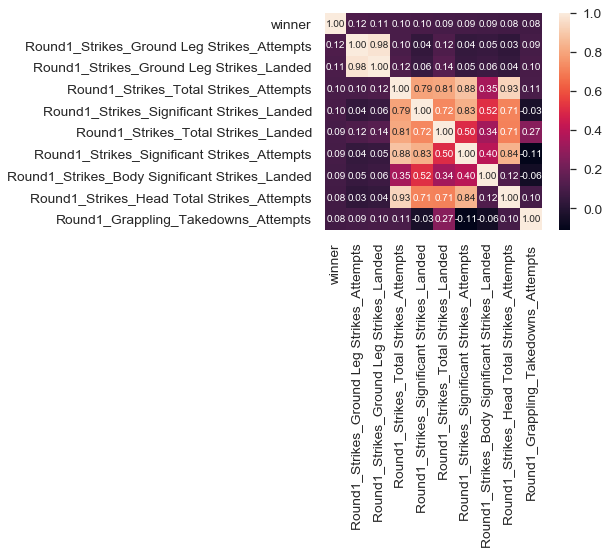

In [22]:
# Subset Correlation Matrix
n = 10 #number of variables for heatmap
corrmat = diff.corr()
cols = corrmat.nlargest(n, 'winner')['winner'].index
cm = np.corrcoef(diff[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

In [23]:
cols

Index(['winner', 'Round1_Strikes_Ground Leg Strikes_Attempts',
       'Round1_Strikes_Ground Leg Strikes_Landed',
       'Round1_Strikes_Total Strikes_Attempts',
       'Round1_Strikes_Significant Strikes_Landed',
       'Round1_Strikes_Total Strikes_Landed',
       'Round1_Strikes_Significant Strikes_Attempts',
       'Round1_Strikes_Body Significant Strikes_Landed',
       'Round1_Strikes_Head Total Strikes_Attempts',
       'Round1_Grappling_Takedowns_Attempts'],
      dtype='object')

In [ ]:
#Pretty crazy that the strongest correlation to winning the fight from first round data is ground leg strikes.
#I guess it makes sense because leg strikes are known to really wear down opponents. Still suprising

In [29]:
D = diff
for col in D.columns:
    D[col] = (D[col]-min(D[col]))/ (max(D[col]) - min(D[col])) #subtract the minimum and divide by the range forcing a scale of 0 to 1 for each feature
D

,Prev,Age,Height,Weight,Round1_Grappling_Reversals_Landed,Round1_Grappling_Standups_Landed,Round1_Grappling_Submissions_Attempts,Round1_Grappling_Takedowns_Attempts,Round1_Grappling_Takedowns_Landed,Round1_Strikes_Body Significant Strikes_Attempts,Round1_Strikes_Body Significant Strikes_Landed,Round1_Strikes_Body Total Strikes_Attempts,Round1_Strikes_Body Total Strikes_Landed,Round1_Strikes_Clinch Body Strikes_Attempts,Round1_Strikes_Clinch Body Strikes_Landed,Round1_Strikes_Clinch Head Strikes_Attempts,Round1_Strikes_Clinch Head Strikes_Landed,Round1_Strikes_Clinch Leg Strikes_Attempts,Round1_Strikes_Clinch Leg Strikes_Landed,Round1_Strikes_Clinch Significant Kicks_Attempts,Round1_Strikes_Clinch Significant Kicks_Landed,Round1_Strikes_Clinch Significant Punches_Attempts,Round1_Strikes_Clinch Significant Punches_Landed,Round1_Strikes_Clinch Significant Strikes_Attempts,Round1_Strikes_Clinch Significant Strikes_Landed,Round1_Strikes_Clinch Total Strikes_Attempts,Round1_Strikes_Clinch Total Strikes_Landed,Round1_Strikes_Distance Body Kicks_Attempts,Round1_Strikes_Distance Body Kicks_Landed,Round1_Strikes_Distance Body Punches_Attempts,Round1_Strikes_Distance Body Punches_Landed,Round1_Strikes_Distance Body Strikes_Attempts,Round1_Strikes_Distance Body Strikes_Landed,Round1_Strikes_Distance Head Kicks_Attempts,Round1_Strikes_Distance Head Kicks_Landed,Round1_Strikes_Distance Head Punches_Attempts,Round1_Strikes_Distance Head Punches_Landed,Round1_Strikes_Distance Head Strikes_Attempts,Round1_Strikes_Distance Head Strikes_Landed,Round1_Strikes_Distance Leg Kicks_Attempts,Round1_Strikes_Distance Leg Kicks_Landed,Round1_Strikes_Distance Leg Strikes_Attempts,Round1_Strikes_Distance Leg Strikes_Landed,Round1_Strikes_Distance Strikes_Attempts,Round1_Strikes_Distance Strikes_Landed,Round1_Strikes_Ground Body Strikes_Attempts,Round1_Strikes_Ground Body Strikes_Landed,Round1_Strikes_Ground Head Strikes_Attempts,Round1_Strikes_Ground Head Strikes_Landed,Round1_Strikes_Ground Leg Strikes_Attempts,Round1_Strikes_Ground Leg Strikes_Landed,Round1_Strikes_Ground Significant Kicks_Attempts,Round1_Strikes_Ground Significant Kicks_Landed,Round1_Strikes_Ground Significant Punches_Attempts,Round1_Strikes_Ground Significant Punches_Landed,Round1_Strikes_Ground Significant Strikes_Attempts,Round1_Strikes_Ground Significant Strikes_Landed,Round1_Strikes_Ground Total Strikes_Attempts,Round1_Strikes_Ground Total Strikes_Landed,Round1_Strikes_Head Significant Strikes_Attempts,Round1_Strikes_Head Significant Strikes_Landed,Round1_Strikes_Head Total Strikes_Attempts,Round1_Strikes_Head Total Strikes_Landed,Round1_Strikes_Kicks_Attempts,Round1_Strikes_Kicks_Landed,Round1_Strikes_Knock Down_Landed,Round1_Strikes_Leg Total Strikes_Attempts,Round1_Strikes_Leg Total Strikes_Landed,Round1_Strikes_Legs Significant Strikes_Attempts,Round1_Strikes_Legs Significant Strikes_Landed,Round1_Strikes_Legs Total Strikes_Attempts,Round1_Strikes_Legs Total Strikes_Landed,Round1_Strikes_Punches_Attempts,Round1_Strikes_Punches_Landed,Round1_Strikes_Significant Strikes_Attempts,Round1_Strikes_Significant Strikes_Landed,Round1_Strikes_Total Strikes_Attempts,Round1_Strikes_Total Strikes_Landed,Round1_TIP_Back Control Time,Round1_TIP_Clinch Time,Round1_TIP_Control Time,Round1_TIP_Distance Time,Round1_TIP_Ground Control Time,Round1_TIP_Ground Time,Round1_TIP_Guard Control Time,Round1_TIP_Half Guard Control Time,Round1_TIP_Misc. Ground Control Time,Round1_TIP_Mount Control Time,Round1_TIP_Neutral Time,Round1_TIP_Side Control Time,Round1_TIP_Standing Time,winner
338,0.545455,0.505882,0.501272,0.500000,0.500000,0.600000,0.700000,0.621053,0.441860,0.705202,0.627737,0.647482,0.648000,0.692308,0.637168,0.511254,0.524590,0.586207,0.480769,0.571429,0.611111,0.459016,0.411765,0.600000,0.610465,0.404412,0.452663,0.492537,0.632653,0.581395,0.463415,0.683871,0.545455,0.352941,0.500000,0.342730,0.342960,0.562650,0.577093,0.275862,0.250000,0.446481,0.476268,0.553846,0.606028,0.314286,0.285714,0.4

In [30]:
y = D.loc[:, 'winner']
X = D.iloc[:, 0:-1]

X_train ,X_test ,y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

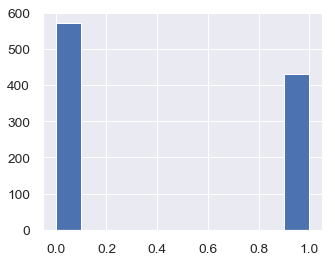

In [31]:
y.hist(figsize=(5,4))

# Decision Tree

In [32]:
# Train a DT classifier

Detree = DecisionTreeClassifier(random_state=10)  
Detree.fit(X_train, y_train)  

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=10,
            splitter='best')

In [33]:
# Make predictions for test data

y_pred = Detree.predict(X_test) 

In [34]:
# Calculate Accuracy , AUC and Confusion matrix 
acc = accuracy_score(y_test,y_pred) * 100
print("Accuracy is :{0}".format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Accuracy is :54.22885572139303

AUC is :0.54

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,71,57,128
1.0,35,38,73
All,106,95,201


### Decision Tree 2 using Grid Search

In [35]:
#creating grid for grid search
dt_param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 2, 3, 4, 5, 6],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 3, 4, 5, 6]
}

In [36]:
num_decision_trees = 3 * 2 * 6 * 3 * 6
print("Grid Search will have to search through {} different permutations.".format(num_decision_trees))

Grid Search will have to search through 648 different permutations.


In [37]:
dt_grid_search = GridSearchCV(Detree, dt_param_grid, cv=3, return_train_score=True)
dt_grid_search.fit(X, y)

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=10,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'criterion': ['gini', 'entropy'], 'max_depth': [None, 2, 3, 4, 5, 6], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 3, 4, 5, 6]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=0)

In [38]:
#decision tree with grid search
dt_gs_training_score = np.mean(dt_grid_search.cv_results_['mean_train_score'])
dt_gs_testing_score = dt_grid_search.score(X, y)

print("Mean Training Score: {:.4}%".format(dt_gs_training_score * 100))
print("Mean Testing Score: {:.4}%".format(dt_gs_testing_score * 100))
print("Best Parameter Combination Found During Grid Search:")
dt_grid_search.best_params_

Mean Training Score: 71.81%
Mean Testing Score: 65.53%
Best Parameter Combination Found During Grid Search:


{'criterion': 'entropy',
 'max_depth': 4,
 'min_samples_leaf': 6,
 'min_samples_split': 2}

In [39]:
#Decision tree using new parameters from the grid search
Detree2 = DecisionTreeClassifier(criterion='entropy',max_depth=4, min_samples_leaf=6, min_samples_split=2)  
Detree2.fit(X_train, y_train)  

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=6, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [40]:
y_pred = Detree2.predict(X_test) 

In [41]:
# Calculate Accuracy , AUC and Confusion matrix 
acc = accuracy_score(y_test,y_pred) * 100
print("Decision Tree Accuracy is :{0}".format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Decision Tree Accuracy is :56.21890547263681

AUC is :0.55

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,76,52,128
1.0,36,37,73
All,112,89,201


# Logistic Regression

In [42]:
#logistic regression
logreg = LogisticRegression(fit_intercept = False, C = 1e16)
model_log = logreg.fit(X_train, y_train)
model_log

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1e+16, class_weight=None, dual=False,
          fit_intercept=False, intercept_scaling=1, max_iter=100,
          multi_class='warn', n_jobs=None, penalty='l2', random_state=None,
          solver='warn', tol=0.0001, verbose=0, warm_start=False)

In [43]:
y_pred = logreg.predict(X_test)

In [44]:
# Calculate Accuracy , AUC and Confusion matrix 
acc = accuracy_score(y_test,y_pred) * 100
print("Logistic Regression Accuracy is :{0}".format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Logistic Regression Accuracy is :60.69651741293532

AUC is :0.58

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,88,40,128
1.0,39,34,73
All,127,74,201


Test AUC: 0.6261772260273972
train AUC: 0.7159884603704829


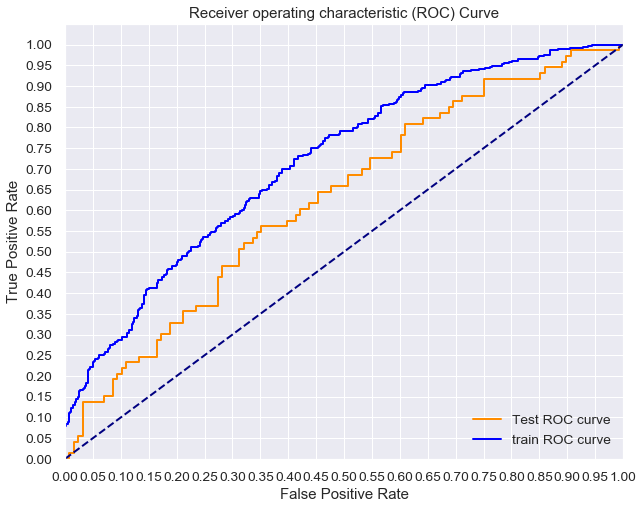

In [45]:
y_test_score = logreg.decision_function(X_test)
y_train_score = logreg.decision_function(X_train)

test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_score)
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_score)

print('Test AUC: {}'.format(auc(test_fpr, test_tpr)))
print('train AUC: {}'.format(auc(train_fpr, train_tpr)))

plt.figure(figsize=(10,8))
lw = 2
plt.plot(test_fpr, test_tpr, color='darkorange',
         lw=lw, label='Test ROC curve')
plt.plot(train_fpr, train_tpr, color='blue',
         lw=lw, label='train ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Random Forest

In [46]:
forest = RandomForestClassifier(n_estimators=100, max_depth= 5)
forest.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=5, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [47]:
y_pred = forest.predict(X_test)

In [48]:
# Calculate Accuracy , AUC and Confusion matrix 
acc = accuracy_score(y_test,y_pred) * 100
print("Random Forest Accuracy is :{0}".format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Random Forest Accuracy is :64.17910447761194

AUC is :0.56

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,109,19,128
1.0,53,20,73
All,162,39,201


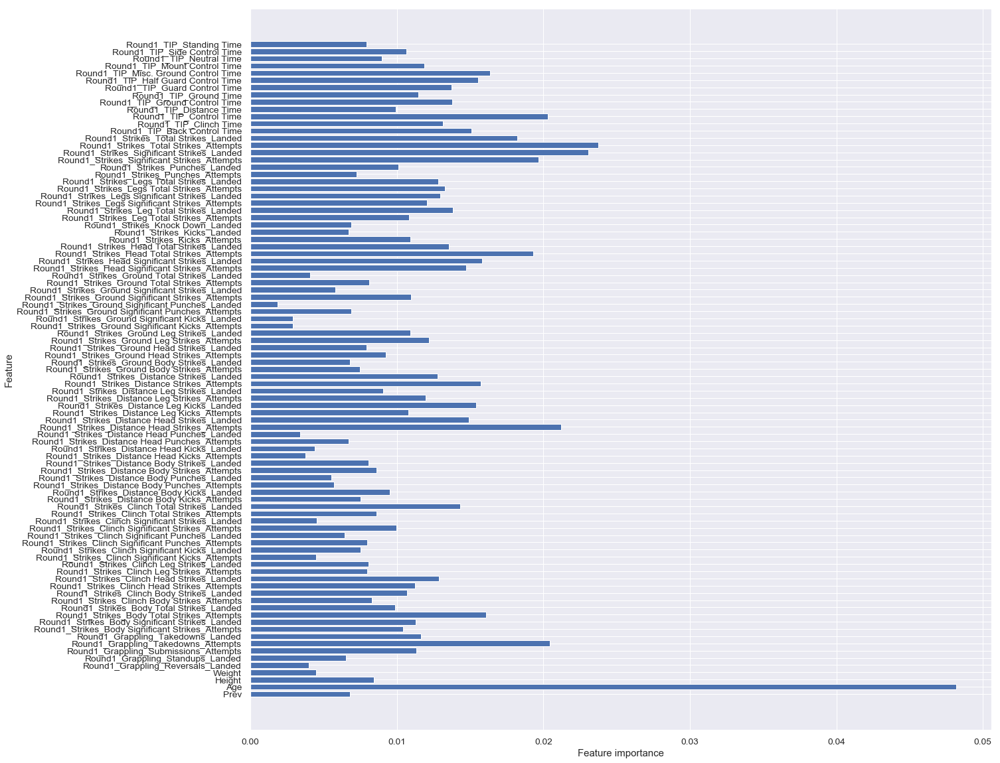

In [49]:
#function to look at importance of features
def plot_feature_importances(model):
    n_features = X_train.shape[1]
    plt.figure(figsize=(20,20))
    plt.barh(range(n_features), model.feature_importances_, align='center') 
    plt.yticks(np.arange(n_features), X_train.columns.values) 
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")
    
plot_feature_importances(forest)

### grid search on random forest

In [51]:
rf_grid_search = GridSearchCV(forest, dt_param_grid, cv=3, return_train_score=True)
rf_grid_search.fit(X, y)

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=5, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'criterion': ['gini', 'entropy'], 'max_depth': [None, 2, 3, 4, 5, 6], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 3, 4, 5, 6]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=0)

In [52]:
rf_training_score = np.mean(rf_grid_search.cv_results_['mean_train_score'])
rf_testing_score = rf_grid_search.score(X, y)

print("Mean Training Score: {:.4}%".format(dt_gs_training_score * 100))
print("Mean Testing Score: {:.4}%".format(dt_gs_testing_score * 100))
print("Best Parameter Combination Found During Grid Search:")
rf_grid_search.best_params_

Mean Training Score: 71.81%
Mean Testing Score: 65.53%
Best Parameter Combination Found During Grid Search:


{'criterion': 'gini',
 'max_depth': 5,
 'min_samples_leaf': 1,
 'min_samples_split': 5}

In [53]:
forest2 = RandomForestClassifier(criterion='entropy',max_depth=6, min_samples_leaf=1, min_samples_split=2)  
forest2.fit(X_train, y_train)  

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=6, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [54]:
# Calculate Accuracy , AUC and Confusion matrix 
acc = accuracy_score(y_test,y_pred) * 100
print("Random Forest 2 Accuracy is :{0}".format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Random Forest 2 Accuracy is :64.17910447761194

AUC is :0.56

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,109,19,128
1.0,53,20,73
All,162,39,201


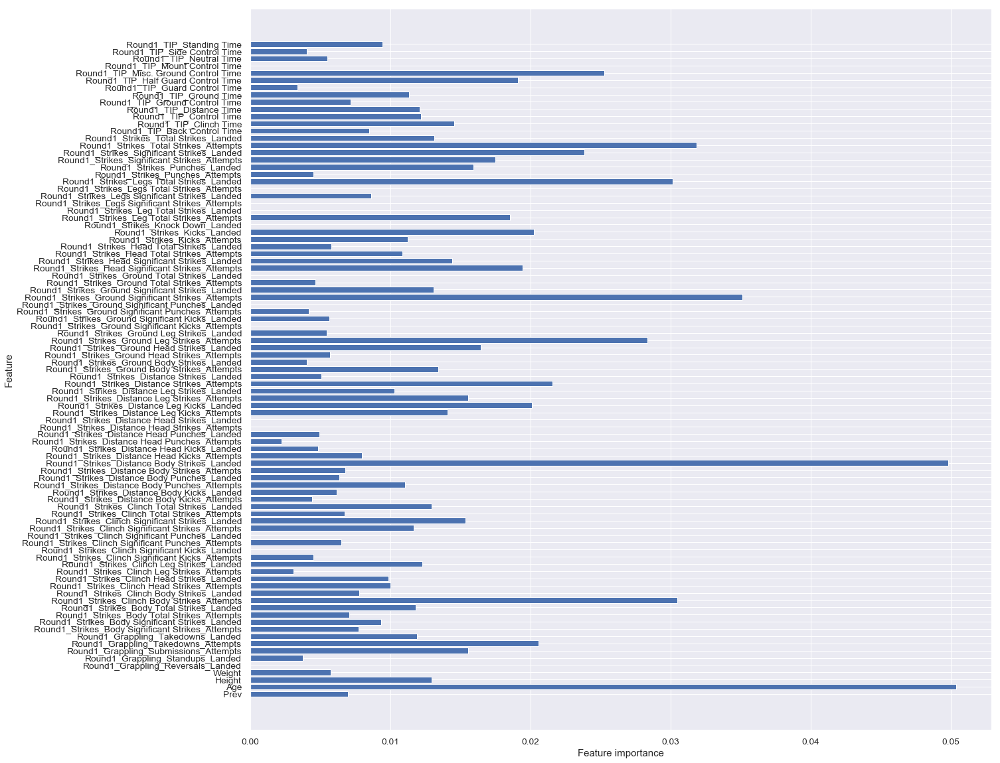

In [55]:
#importance of features
plot_feature_importances(forest2)

In [ ]:
#explore the distribution of the features and create new features
#effect size - given all of the features (fight statistics) how different are the 2 classes (winning or losing)
#look at AUC and ROC curves
#figure out if it is better to have a high precision or recall - not sure how this really applies to my data set
#perform feature selection using PCA and/or regularization
#look at what features have a high covariance with eachother - maybe